In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [2]:
# 하이퍼파라미터 튜닝
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# XGBoost 하이퍼파라미터 그리드 설정
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42)
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)
best_xgb_model = grid_search_xgb.best_estimator_

# LightGBM 하이퍼파라미터 그리드 설정
param_grid_lgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

lgb = LGBMRegressor(random_state=42)
grid_search_lgb = GridSearchCV(estimator=lgb, param_grid=param_grid_lgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_lgb.fit(X_train, y_train)
best_lgb_model = grid_search_lgb.best_estimator_

# CatBoost 하이퍼파라미터 그리드 설정
param_grid_cat = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

cat = CatBoostRegressor(random_state=42, verbose=0)
grid_search_cat = GridSearchCV(estimator=cat, param_grid=param_grid_cat, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_cat.fit(X_train, y_train)
best_cat_model = grid_search_cat.best_estimator_


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5010
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5004
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Start training from score -14.037767[LightGBM] [Info] Start training from score -29.167488

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enoug

In [3]:
# Stacking Ensemble 모델
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [4]:
# 이거 의미없음 

# 특성 공학 강화
# 예시: 평균과 표준편차의 곱을 새로운 특성으로 추가
data['new_feature'] = data['avg'] * data['dev']

# 데이터 전처리 및 모델 학습 과정 동일
data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링 및 학습/테스트 분할
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


그냥 하나 넣어본거 수학적으로 하나 넣어서 다시 학습 시켜보는 것

특성 공학(Feature Engineering): 특성 공학은 모델의 성능을 향상시키기 위해 데이터를 변환하거나 새로운 특성을 만들어내는 과정입니다. 예를 들어, 여러 특성을 조합하거나 수학적 변환을 통해 새로운 유용한 정보를 생성합니다.



In [5]:
# 이거 의미없음 

# Stacking Ensemble 모델
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5308
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 28
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

다시 돌려서 얻어 내려함 
 

In [6]:
# 모델 특성 중요도 분석
xgb_model = XGBRegressor(colsample_bytree=1.0, learning_rate=0.05, max_depth=5, n_estimators=200, subsample=0.8, random_state=42)
lgb_model = LGBMRegressor(n_estimators=200, learning_rate=0.05, max_depth=5, subsample=0.8, colsample_bytree=1.0, random_state=42)
cat_model = CatBoostRegressor(iterations=200, learning_rate=0.05, depth=5, subsample=0.8, verbose=0, random_state=42)
lr_model = LinearRegression()
xgb_model.fit(X_train, y_train)
lgb_model.fit(X_train, y_train)
cat_model.fit(X_train, y_train)

importances_xgb = xgb_model.feature_importances_
importances_lgb = lgb_model.feature_importances_
importances_cat = cat_model.feature_importances_

# 평균 특성 중요도 계산
mean_importances = (importances_xgb + importances_lgb + importances_cat) / 3
print("Mean importances len:", len(mean_importances))
# 중요도가 높은 상위 특성 선택
important_features = np.argsort(mean_importances)[::-1][:10]  # 상위 10개의 중요한 특성 선택

print("Important features indices:", important_features)

# 새로운 유용한 특성 생성 (예: 중요 특성들의 곱, 제곱 등)
data['new_feature1'] = data.iloc[:, important_features[0]] * data.iloc[:, important_features[1]]
data['new_feature2'] = data.iloc[:, important_features[2]] ** 2
data['new_feature3'] = data.iloc[:, important_features[3]] / (data.iloc[:, important_features[4]] + 1)  # 0으로 나누는 것 방지


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5308
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 28
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

각 모델로부터 특성 중요도(feature importances)를 추출합니다. 이 값들은 각 특성이 모델의 예측에 얼마나 중요한지를 나타냅니다.

Important features indices: [ 2 27  5  0 17  6 20  1 22  9]
는 index 들


new_feature1: 두 개의 중요한 특성의 곱
new_feature2: 하나의 중요한 특성의 제곱
new_feature3: 두 개의 중요한 특성의 나눗셈(0으로 나누는 것을 방지하기 위해 +1 추가)

이것도 사실 랜덤

In [7]:
# 데이터 전처리 및 스케일링
data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 정의 및 학습
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)

mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5841
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 31
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

다시 추가해서 했는데 이때부터 과적합인듯

In [8]:
from sklearn.ensemble import GradientBoostingRegressor

# 모델 정의
gbr_model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)

# 모델 학습
gbr_model.fit(X_train, y_train)
y_pred_gbr = gbr_model.predict(X_test)

# 모델 평가
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)

print(f'Gradient Boosting Test Mean Squared Error: {mse_gbr}')
print(f'Gradient Boosting R² Score: {r2_gbr}')


Gradient Boosting Test Mean Squared Error: 58922.23446610504
Gradient Boosting R² Score: 0.9915513942097149


In [9]:
from sklearn.model_selection import cross_val_score

# 교차 검증을 통한 모델 성능 평가
cv_scores = cross_val_score(stacking_model, X_scaled, y, cv=10, scoring='r2')

print(f'Cross-Validated R² Scores: {cv_scores}')
print(f'Average Cross-Validated R² Score: {np.mean(cv_scores)}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5866
[LightGBM] [Info] Number of data points in the train set: 1713, number of used features: 31
[LightGBM] [Info] Start training from score 9.059545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Cross-Validated R² Scores: [0.99126527 0.99535754 0.99367472 0.99356312 0.99597768 0.99605092
 0.99593977 0.99367641 0.98392243 0.99336289 0.99514039 0.99201308
 0.98787855 0.98782901 0.97014137 0.97459295 0.98747216 0.9925091
 0.99273322 0.97165718]
Average Cross-Validated R² Score: 0.9892378895269482


이거 이렇게 너무 높게 나오는데  이게 맞나 싶긴한데

GPT 왈 :

이 결과는 스태킹 앙상블 모델이 20겹 교차 검증에서도 매우 일관되고 높은 성능을 보였음을 나타냅니다. 모델이 데이터의 다양한 분할에서도 높은 설명력을 가지고 있다는 것을 의미하며, 이는 모델이 일반화 성능이 우수하다는 것을 보여줍니다.

이러한 결과는 모델이 잘 학습되었으며, 실제 환경에서도 좋은 성능을 발휘할 가능성이 높다는 것을 시사합니다. 다만, 더 확실한 평가를 위해 추가적인 테스트 데이터셋을 사용해 보는 것도 좋은 방법입니다.


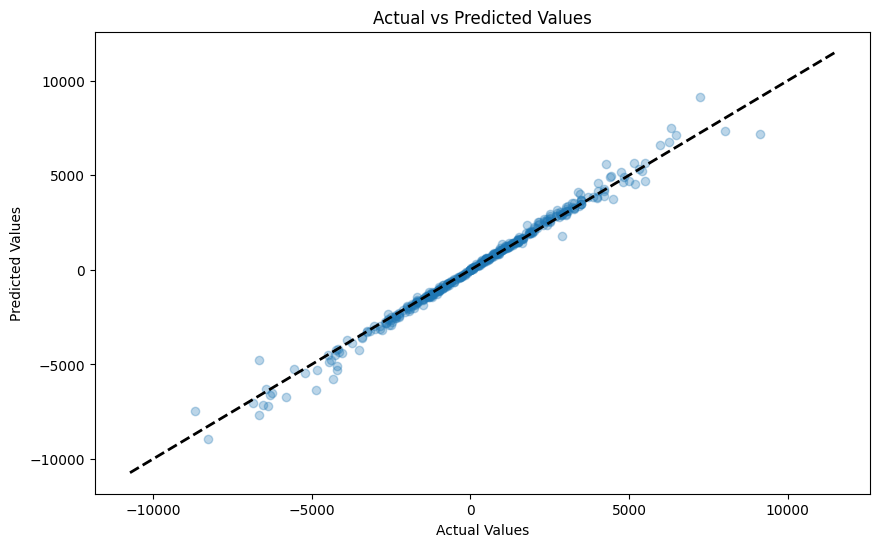

In [10]:
import matplotlib.pyplot as plt

# 실제 값과 예측 값의 분포 비교
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking, alpha=0.3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.show()


Stacking Ensemble Train Mean Squared Error: 18868.220203447545
Stacking Ensemble Train R² Score: 0.9974439844939301
Stacking Ensemble Test Mean Squared Error: 103148.40151971743
Stacking Ensemble Test R² Score: 0.9852099943215927
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5843
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 31
[LightGBM] [Info] Start training from score -15.132633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

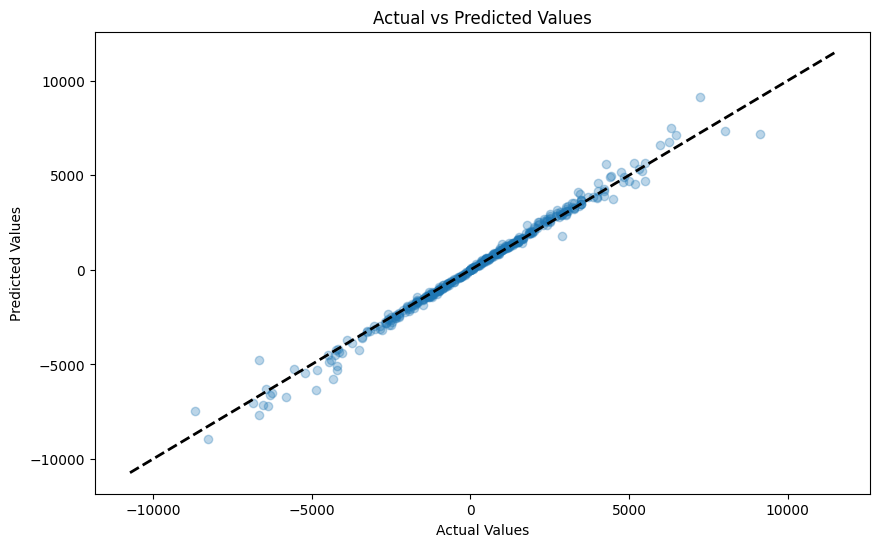

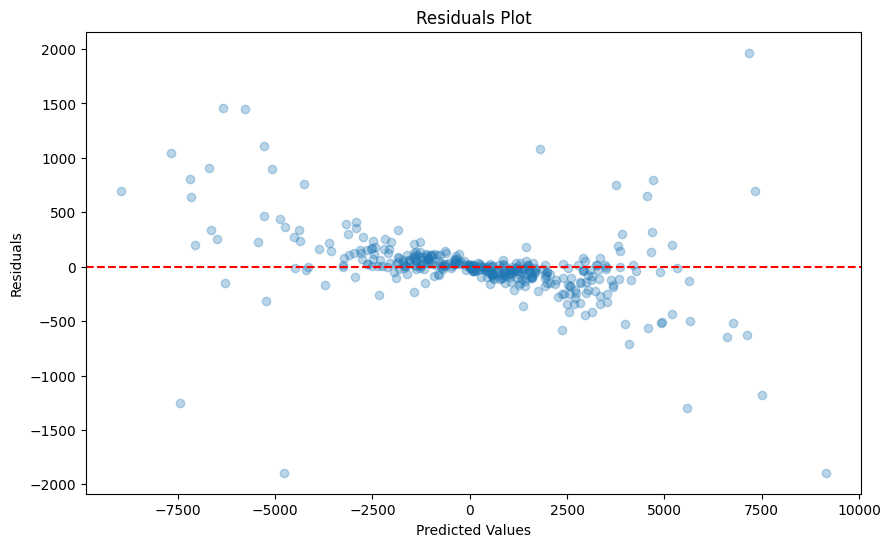

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1289
[LightGBM] [Info] Number of data points in the train set: 152, number of used features: 31
[LightGBM] [Info] Start training from score -77.940789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

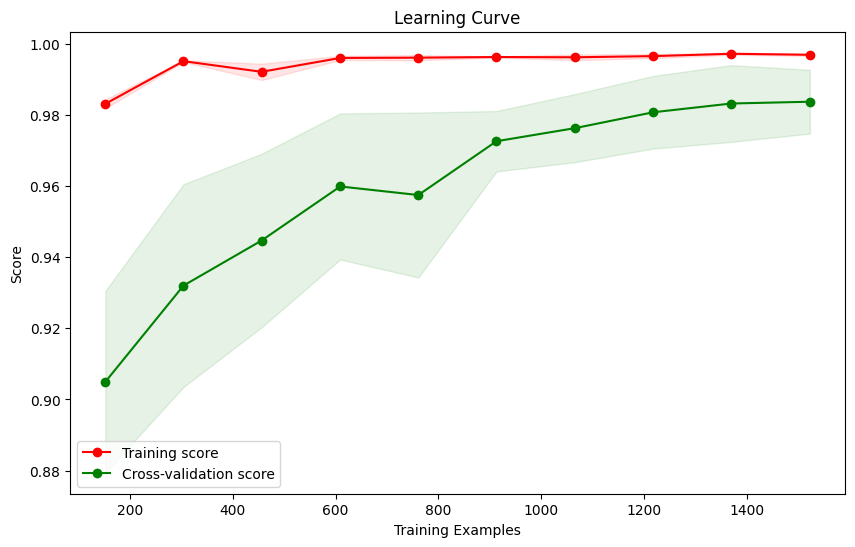

The final model does not have feature_importances_ attribute.


In [20]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, learning_curve
import seaborn as sns
# 학습 데이터 성능 평가
y_train_pred = stacking_model.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
print(f'Stacking Ensemble Train Mean Squared Error: {mse_train}')
print(f'Stacking Ensemble Train R² Score: {r2_train}')

# 테스트 데이터 성능 평가
y_pred_stacking = stacking_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_stacking)
r2_test = r2_score(y_test, y_pred_stacking)
print(f'Stacking Ensemble Test Mean Squared Error: {mse_test}')
print(f'Stacking Ensemble Test R² Score: {r2_test}')

# 교차 검증 성능 평가
cv_scores = cross_val_score(stacking_model, X_scaled, y, cv=5, scoring='r2')
print(f'Cross-Validated R² Scores: {cv_scores}')
print(f'Average Cross-Validated R² Score: {np.mean(cv_scores)}')

# 시각화 1: 실제 값과 예측 값의 분포 비교
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking, alpha=0.3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.show()

# 시각화 2: 잔차 분석 (Residuals Plot)
residuals = y_test - y_pred_stacking
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_stacking, residuals, alpha=0.3)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# 시각화 3: 학습 곡선 (Learning Curve)
train_sizes, train_scores, test_scores = learning_curve(stacking_model, X_scaled, y, cv=5, scoring='r2', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='r')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color='g')
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# 시각화 4: 특성 중요도 (Feature Importances)
final_model = stacking_model.final_estimator_
if hasattr(final_model, 'feature_importances_'):
    importances = final_model.feature_importances_
    features = data_processed.columns
    feature_importances = pd.Series(importances, index=features).sort_values(ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=feature_importances, y=feature_importances.index)
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Features')
    plt.title('Feature Importances')
    plt.show()
else:
    print("The final model does not have feature_importances_ attribute.")


In [31]:
# 시각화 4: 각 개별 모델의 특성 중요도 (Feature Importances)
def plot_feature_importances(model, model_name):
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        features = data.columns
        features = features.drop(['ymd', 'rtn'])
        print("X_train:", X_scaled, len(X_scaled))
        print("Importances len:", len(importances))
        feature_importances = pd.Series(importances, index=X.columns).sort_values(ascending=False)

        plt.figure(figsize=(10, 6))
        sns.barplot(x=feature_importances, y=feature_importances.index)
        plt.xlabel('Feature Importance Score')
        plt.ylabel('Features')
        plt.title(f'{model_name} Feature Importances')
        plt.show()
    else:
        print(f"The model {model_name} does not have feature_importances_ attribute.")

plot_feature_importances(best_xgb_model, 'XGBoost')
plot_feature_importances(best_lgb_model, 'LightGBM')
plot_feature_importances(best_cat_model, 'CatBoost')

X_train: [[ 0.02571479  0.03684599  0.83497301 ... -0.22345583 -0.22693517
  -1.2158272 ]
 [-0.09300686 -0.06450054 -0.75525781 ...  0.25253927 -1.27573125
   0.48632738]
 [-0.06756504 -0.10471349 -0.348771   ... -0.56889246 -0.65422246
  -0.19038781]
 ...
 [ 0.98769511  1.07438541  0.88089412 ...  1.91747887  0.0158417
  -0.37916596]
 [ 1.14059264  1.1663125   0.70231204 ... -1.6078228   0.27804072
   0.68937502]
 [ 1.06352735  0.9439149   1.99660686 ... -0.5807333  -1.38255307
  -0.10175737]] 1904
Importances len: 27


ValueError: Length of values (27) does not match length of index (31)

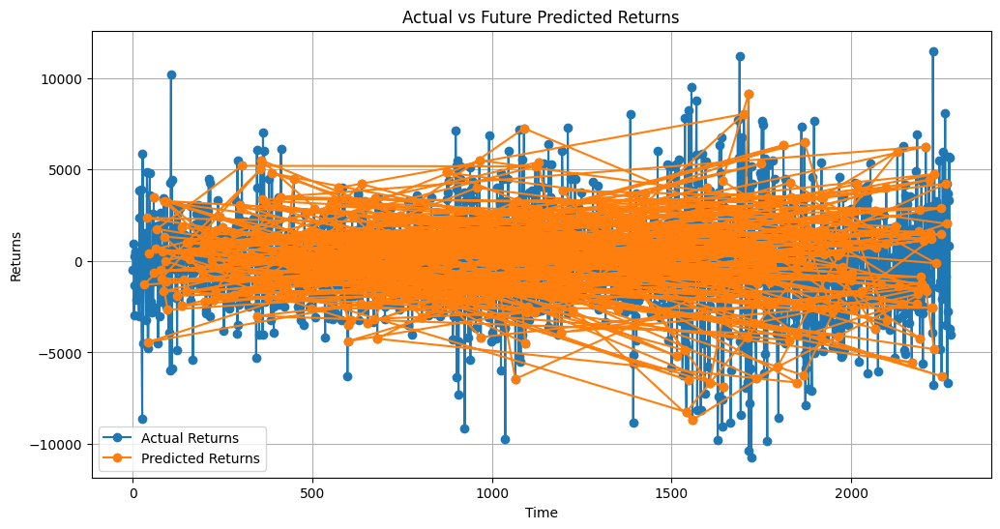

In [32]:
# 원본 데이터의 실제 값과 비교하여 시각화
plt.figure(figsize=(12, 6))

# 원본 데이터의 실제 값 플롯
plt.plot(y, label='Actual Returns', marker='o')

# 미래 예측 값 플롯
plt.plot(y_test, label='Predicted Returns', marker='o')

# 그래프 설정
plt.xlabel('Time')
plt.ylabel('Returns')
plt.title('Actual vs Future Predicted Returns')
plt.legend()
plt.grid(True)
plt.show()